## clustering of features

### Needs to be run before test-model !!
test-model needs the `vgg16_features_all.npy` file that this notebook creates !

This notebook is about using VGG16 / VGG19 to create a feature vector for each of the cars extracted by YOLO.

In [1]:
import tensorflow as tf
import numpy as np
import polars as pl
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
import os

2024-03-04 22:22:32.877979: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-04 22:22:32.879870: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-04 22:22:32.914363: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-04 22:22:32.914396: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-04 22:22:32.915295: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

In [4]:
cars = np.load("cars_all.npy")

In [3]:
base_model = VGG16(include_top=False, weights='imagenet', input_shape=cars[0].shape)
embedding_layer = tf.keras.Sequential([
    *base_model.layers,
    tf.keras.layers.Flatten()
])

2024-03-04 22:22:41.565011: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [19]:
data = np.array([embedding_layer(np.expand_dims(car, axis=0)).numpy()[0] for car in cars])
data.shape

(1315, 4608)

In [20]:
with open("vgg16_features_all.npy", "wb") as f:
    np.save(f, data)
    data = np.load(f)

UnsupportedOperation: read

In [48]:
with open("vgg16_features_all.npy", "rb") as f:
    data = np.load(f)

In [ ]:
# data = np.array([extract(car).numpy()[0] for car in cars])
# data.shape

In [44]:
pca = PCA(n_components=2, random_state=22)
pca.fit(data)
X = pca.transform(data)

In [50]:
tSNE=TSNE(n_components=3)
X=tSNE.fit_transform(data)

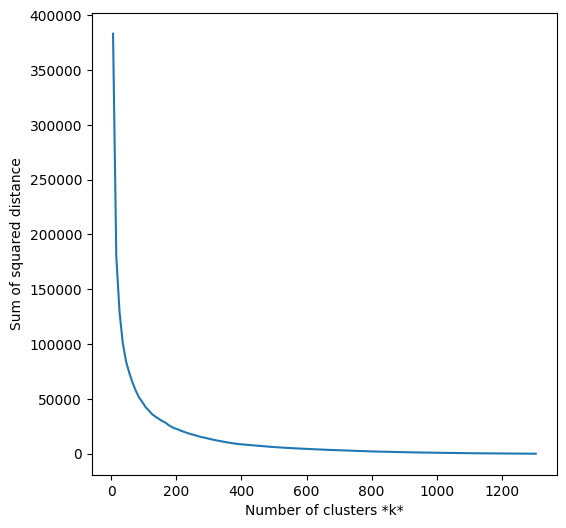

In [53]:
sse = []
list_k = list(range(5, len(data), 10))

for k in list_k:
    print(k, end='\r')
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(X)
    sse.append(km.inertia_)

plt.figure(figsize=(6, 6))
plt.plot(list_k, sse)
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

In [54]:
kmeans = KMeans(n_clusters=500, random_state=0)
kmeans.fit(X)

groups = {}
dfs = []
for uid, cluster in zip(list(range(len(data))),kmeans.labels_):
    dfs.append({'car_id': uid, 'cluster': cluster, 'x': X[uid][0], 'y': X[uid][1]})
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(uid)
    else:
        groups[cluster].append(uid)

df = pl.from_dicts(dfs)

6


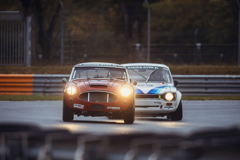

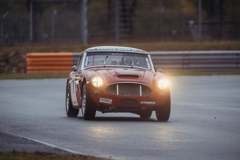

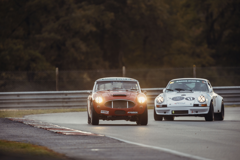

175


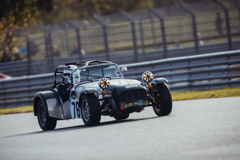

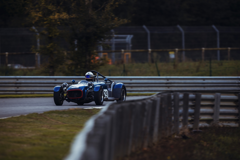

189


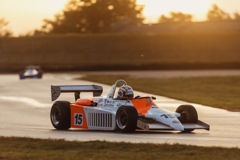

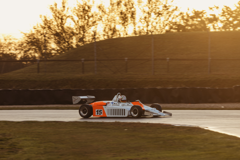

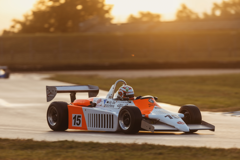

312


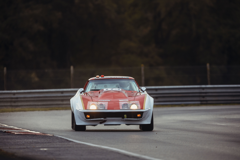

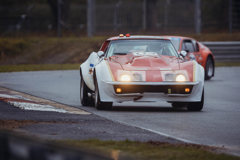

93


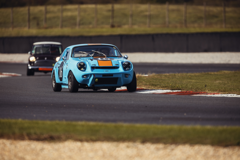

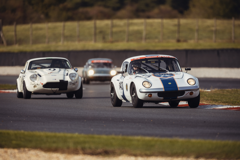

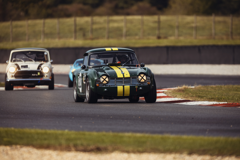

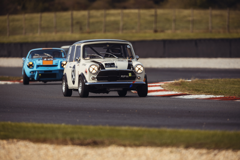

403


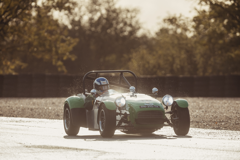

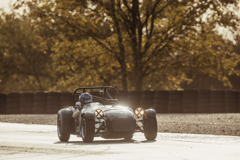

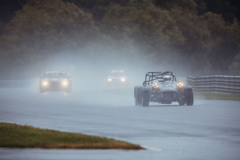

414


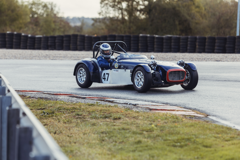

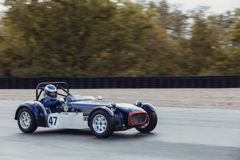

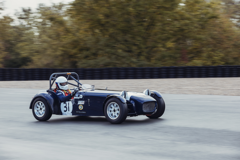

452


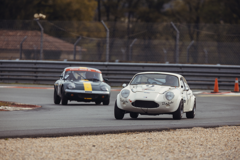

139


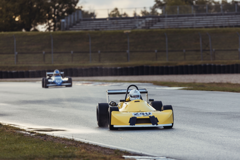

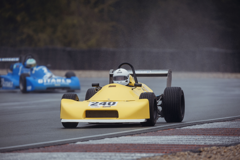

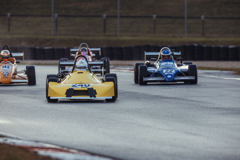

135


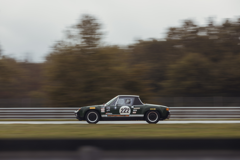

430


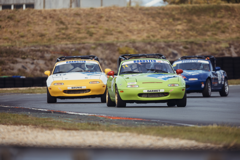

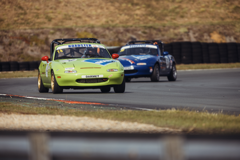

456


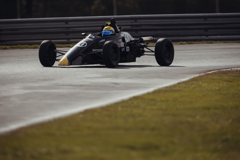

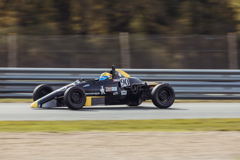

359


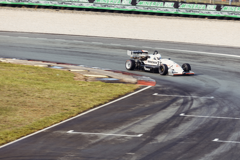

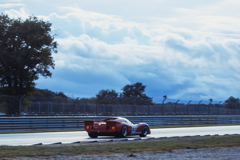

46


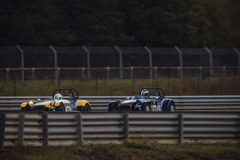

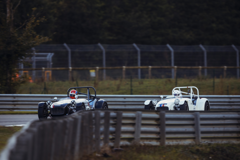

376


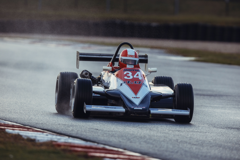

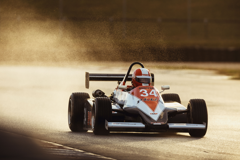

303


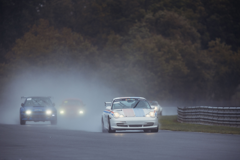

478


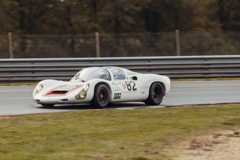

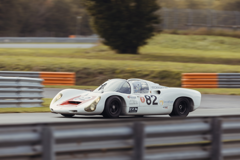

480


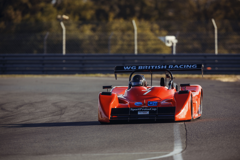

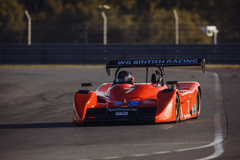

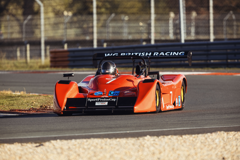

292


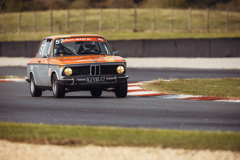

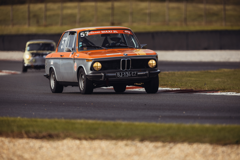

18


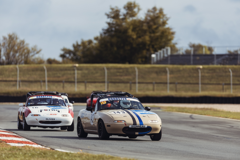

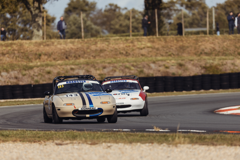

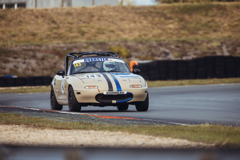

123


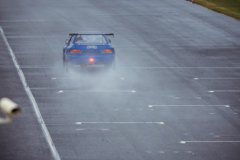

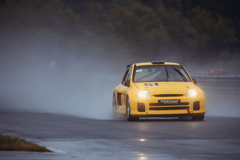

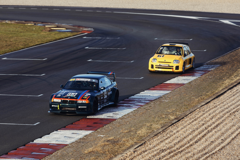

43


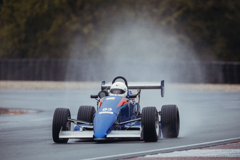

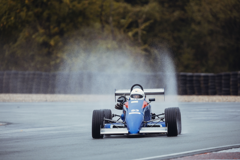

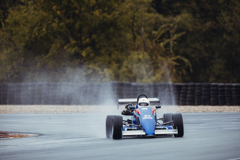

328


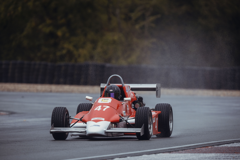

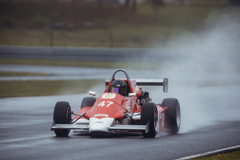

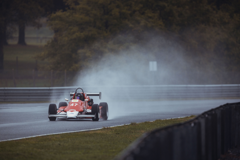

391


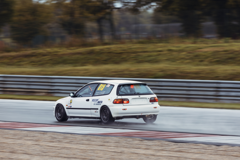

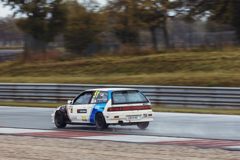

84


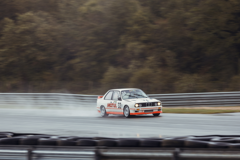

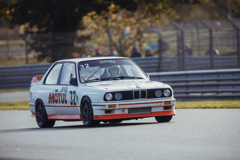

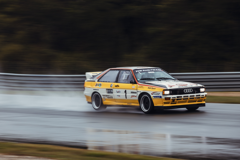

413


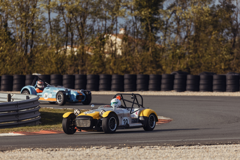

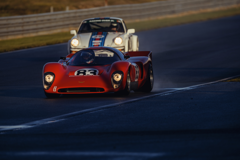

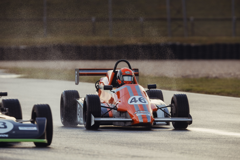

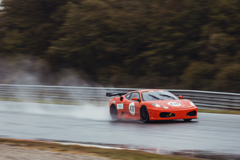

68


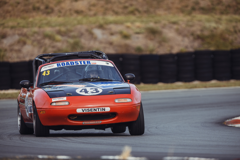

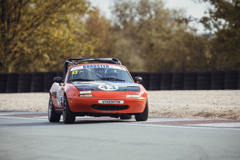

49


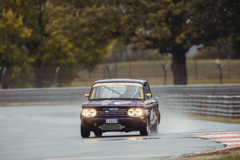

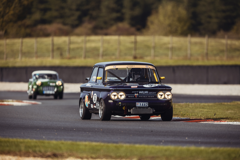

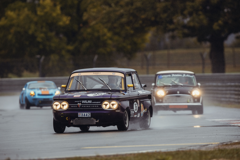

408


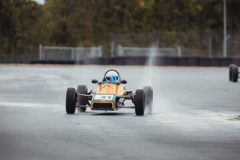

316


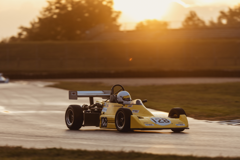

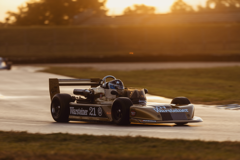

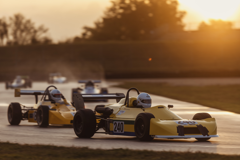

71


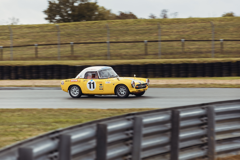

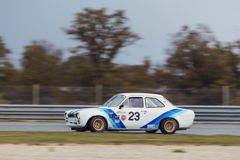

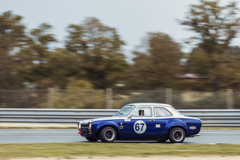

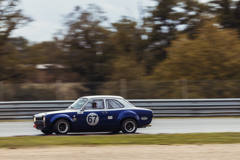

341


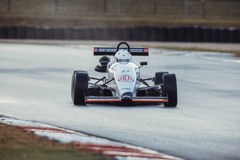

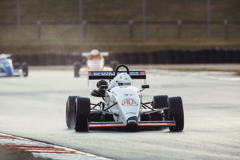

193


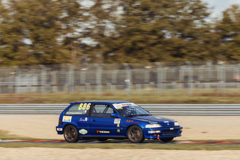

122


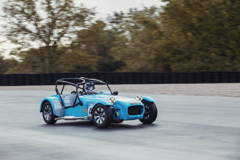

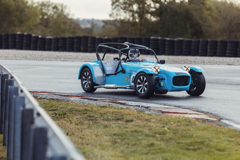

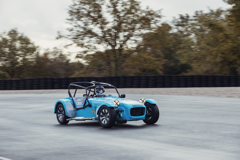

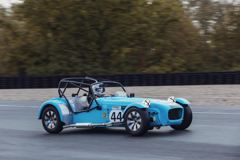

185


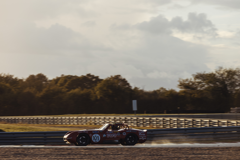

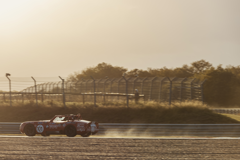

231


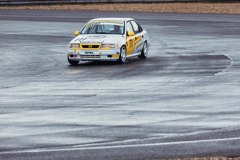

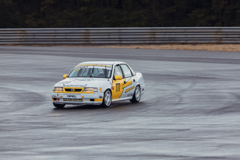

34


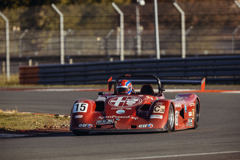

5


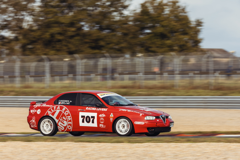

162


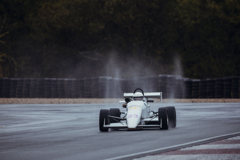

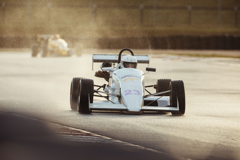

374


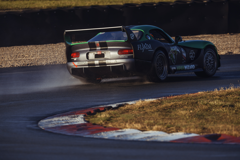

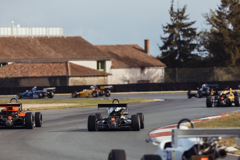

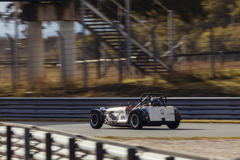

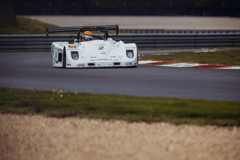

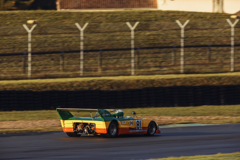

361


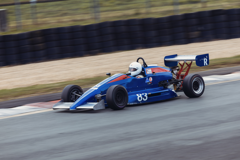

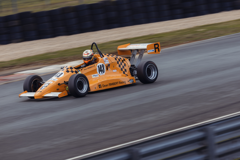

339


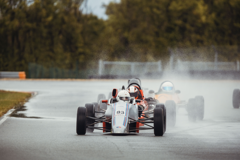

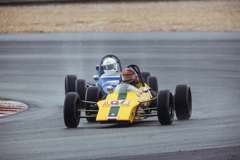

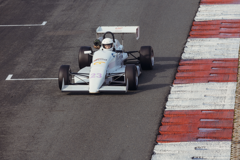

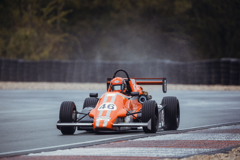

225


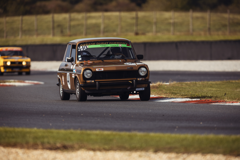

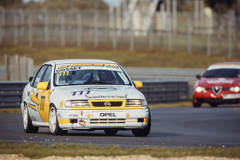

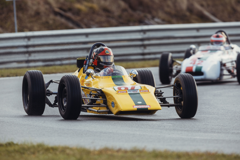

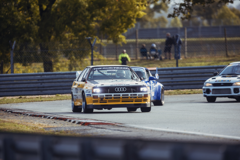

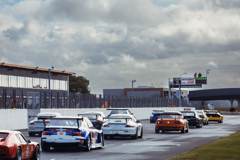

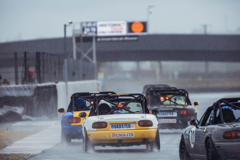

207


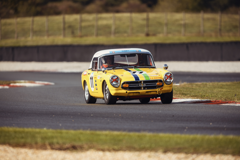

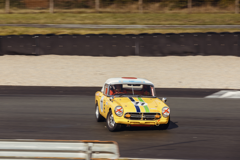

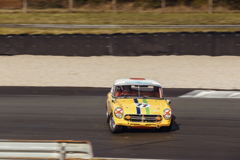

291


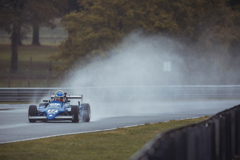

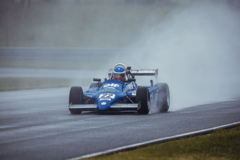

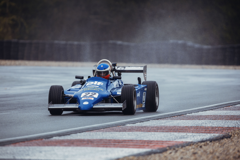

137


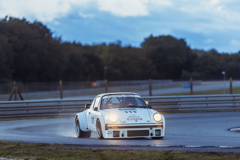

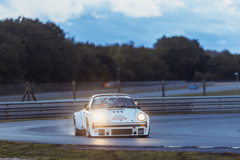

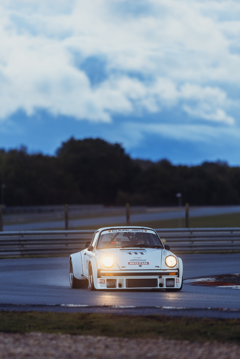

447


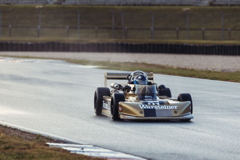

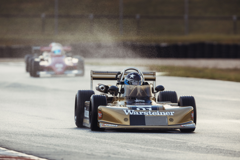

371


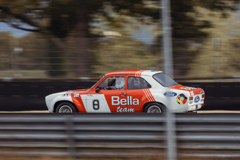

47


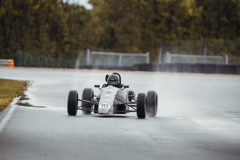

118


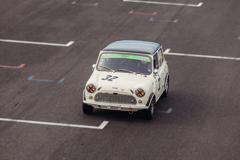

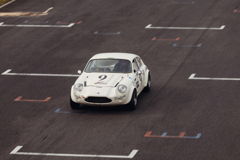

In [55]:
def display_image(img, size=640):
    if isinstance(img, str):
        img = Image.open(img+".png")
    else:
        img = Image.fromarray(img)
    img = img.resize((size, int(img.height // (img.width / size))))
    display(img)

car_paths = open("cars.txt", "r").read().split(".png")
group_ids = list(range(len(groups)))
np.random.shuffle(group_ids)
for i in group_ids[:50]:
    print(i)
    for uid in groups[i]:
        car = cars[uid]
        # display_image(car, size=120)
        display_image(car_paths[uid], size=240)

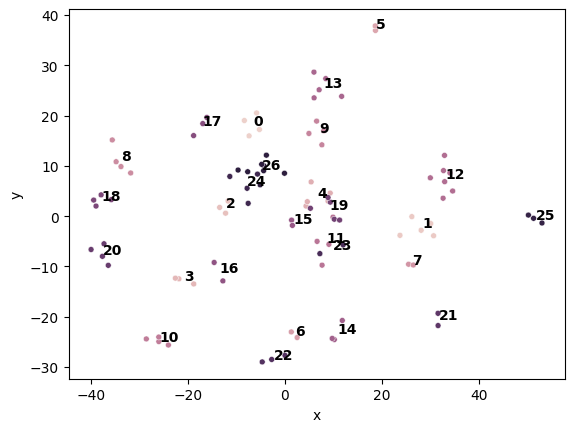

In [42]:
df1 = df.sort('cluster').head(100)
sns.scatterplot(df1, x="x", y="y", hue="cluster", legend=False, size=20)
for row in df1.group_by("cluster").agg(pl.col("x").mean(), pl.col("y").mean()).rows(named=True):
     plt.text(row['x']+0.2, row['y'], row['cluster'], horizontalalignment='left', size=10, color='black', weight='semibold')

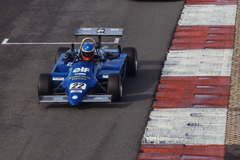

In [37]:
for car_id in df1.filter(pl.col("cluster").is_in([19]))["car_id"]:
    display_image(car_paths[car_id], size=240)